# 🚗 Capstone Project Module 4 — Vehicle Detection with YOLOv12

**Objective:** Build an object detection system that can detect and count vehicles (bus, car, van) from images using YOLOv12.

**Dataset:** Vehicle Detection — 9000+ images (classes: bus, car, van)

**Training Strategy:**
- Batch size: 8
- Image size: 480 (reduced for memory efficiency)
- Auto-save checkpoints to Google Drive
- Resume training support if Colab disconnects

**Workflow:**
1. Environment Setup
2. Dataset Loading & Exploration (EDA)
3. Data Preprocessing & Augmentation Pipeline
4. Model Training (with Resume Support)
5. Model Evaluation
6. Inference & Vehicle Counting Analysis
7. Save Model for Streamlit Deployment

---
## ⚙️ STEP 1: Install Dependencies
---

Install library yang dibutuhkan:
- `ultralytics`: Package untuk YOLO models termasuk YOLOv12
- `supervision`: Toolkit untuk evaluasi dan visualisasi object detection

In [ ]:
!pip install ultralytics supervision -q
print("✅ Dependencies installed!")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 217.4/217.4 kB 23.8 MB/s eta 0:00:00
✅ Dependencies installed!


---
## ⚙️ STEP 2: Cek GPU
---

Pastikan GPU aktif. Kalau belum:
- Klik **Runtime** → **Change runtime type** → Pilih **GPU (T4)** → **Save**

In [ ]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
else:
    print("⚠️ GPU TIDAK TERDETEKSI! Aktifkan GPU di Runtime settings!")

PyTorch version: 2.9.0+cpu
CUDA available: False
⚠️ GPU TIDAK TERDETEKSI! Aktifkan GPU di Runtime settings!


---
## ⚙️ STEP 3: Setup Working Directory
---

In [ ]:
import os
HOME = os.getcwd()
print(f"Working directory: {HOME}")

Working directory: /content


---
## 📂 STEP 4: Mount Google Drive & Load Dataset
---

**Instruksi:**
1. Upload file ZIP dataset ke Google Drive
2. Run cell di bawah untuk mount Google Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!scp -r "/content/drive/MyDrive/Purwadhika Files/Project Capstone Modul 4/vehicle-detection.v1i.yolov12.zip"

usage: scp [-346ABCOpqRrsTv] [-c cipher] [-D sftp_server_path] [-F ssh_config]
           [-i identity_file] [-J destination] [-l limit]
           [-o ssh_option] [-P port] [-S program] source ... target


In [ ]:
!unzip "/content/drive/MyDrive/Purwadhika Files/Project Capstone Modul 4/vehicle-detection.v1i.yolov12.zip"

Streaming output truncated to the last 5000 lines.
  inflating: vehicle-detection.v1i.yolov12/train/labels/Screenshot-2025-04-02-144316_png.rf.b43b12f536ff616428d2205b2fb89c13.txt  
  inflating: vehicle-detection.v1i.yolov12/train/labels/Screenshot-2025-04-02-144328_png.rf.1abb666ea3ffadf9e4932a5755e2678a.txt  
  inflating: vehicle-detection.v1i.yolov12/train/labels/Screenshot-2025-04-02-144328_png.rf.86bffe3efaed5fac1d7636143ee0e16f.txt  
  inflating: vehicle-detection.v1i.yolov12/train/labels/Screenshot-2025-04-02-144328_png.rf.b7db8dea1804e35c9487c38290caa6b5.txt  
  inflating: vehicle-detection.v1i.yolov12/train/labels/Screenshot-2025-04-02-144337_png.rf.775afb141f5ebfb8c9e1667f9e2ec568.txt  
  inflating: vehicle-detection.v1i.yolov12/train/labels/Screenshot-2025-04-02-144337_png.rf.88fe75f9d3298cdbc8cd0543acb73c40.txt  
  inflating: vehicle-detection.v1i.yolov12/train/labels/Screenshot-2025-04-02-144337_png.rf.9ed75c33857e9ed74b2f5a9e83f0c683.txt  
  inflating: vehicle-detection.v

---
## 🔍 STEP 5: Cek Struktur Dataset
---

Kita perlu pastiin dataset-nya dalam format YOLO yang benar.

In [ ]:
dataset_location = "/content/vehicle-detection.v1i.yolov12"

#### Lists isi konten dari dataset

In [ ]:
# Cek isi folder hasil unzip
!ls {dataset_location}

data.yaml  README.dataset.txt  README.roboflow.txt  test  train  valid


#### Menampilkan data.yaml configuration file.

In [ ]:
!cat {dataset_location}/data.yaml

train: ../train/images
val: ../valid/images
test: ../test/images

nc: 3
names: ['bus', 'car', 'van']

roboflow:
  workspace: personal-project-kej16
  project: vehicle-detection-vznzd-dkl8g
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/personal-project-kej16/vehicle-detection-vznzd-dkl8g/dataset/1

---
## 📊 STEP 6: Exploratory Data Analysis (EDA)
---

Analisis dataset untuk memahami:
- Jumlah gambar per split (train/valid/test)
- Distribusi class (balanced atau imbalanced?)
- Ukuran bounding box
- Sample gambar + anotasi

In [ ]:
import yaml
import glob
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter

# Load data.yaml
with open(f"{dataset_location}/data.yaml", 'r') as f:
    data_yaml = yaml.safe_load(f)

class_names = data_yaml['names']
print(f"📋 Classes: {class_names}")
print(f"📋 Number of classes: {len(class_names)}")

📋 Classes: ['bus', 'car', 'van']
📋 Number of classes: 3


In [ ]:
# Hitung jumlah images per split
print("\n📊 Dataset Size:")
print("=" * 35)
total_images = 0
for split in ['train', 'valid', 'test']:
    img_path = f"{dataset_location}/{split}/images"
    if os.path.exists(img_path):
        num_images = len(glob.glob(f"{img_path}/*"))
        total_images += num_images
        print(f"  {split:8s}: {num_images} images")
    else:
        print(f"  {split:8s}: ❌ folder not found")
print(f"  {'TOTAL':8s}: {total_images} images")


📊 Dataset Size:
  train   : 9215 images
  valid   : 287 images
  test    : 220 images
  TOTAL   : 9722 images


In [ ]:
# Analisis distribusi class dari training labels
class_counts = Counter()
images_per_class = Counter()  # Track berapa gambar yang mengandung tiap class

train_labels = glob.glob(f"{dataset_location}/train/labels/*.txt")

for label_file in train_labels:
    classes_in_image = set()
    with open(label_file, 'r') as f:
        for line in f.readlines():
            parts = line.strip().split()
            if len(parts) >= 5:
                class_id = int(parts[0])
                if class_id < len(class_names):
                    class_counts[class_names[class_id]] += 1
                    classes_in_image.add(class_names[class_id])
    for cls in classes_in_image:
        images_per_class[cls] += 1

print("\n📊 Class Distribution (Training Set):")
print("=" * 50)
print(f"  {'Class':<12} {'Instances':>10} {'Images':>10}")
print(f"  {'-'*12} {'-'*10} {'-'*10}")
for cls in class_names:
    inst = class_counts.get(cls, 0) if isinstance(class_names, list) else class_counts.get(cls, 0)
    imgs = images_per_class.get(cls, 0) if isinstance(class_names, list) else images_per_class.get(cls, 0)
    print(f"  {cls:<12} {inst:>10} {imgs:>10}")
print(f"  {'-'*12} {'-'*10}")
print(f"  {'TOTAL':<12} {sum(class_counts.values()):>10}")


📊 Class Distribution (Training Set):
  Class         Instances     Images
  ------------ ---------- ----------
  bus                4467       3036
  car               10739       5554
  van                3279       2780
  ------------ ----------
  TOTAL             18485


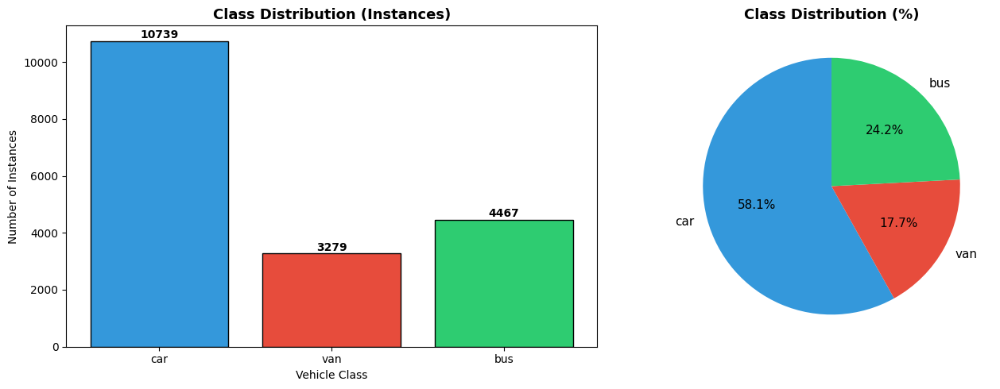

In [ ]:
# Visualisasi distribusi class
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

classes = list(class_counts.keys())
counts = list(class_counts.values())
colors = ['#3498db', '#e74c3c', '#2ecc71', '#f39c12', '#9b59b6']

# Bar chart
bars = axes[0].bar(classes, counts, color=colors[:len(classes)], edgecolor='black')
axes[0].set_title('Class Distribution (Instances)', fontsize=13, fontweight='bold')
axes[0].set_xlabel('Vehicle Class')
axes[0].set_ylabel('Number of Instances')
for bar, count in zip(bars, counts):
    axes[0].text(bar.get_x() + bar.get_width()/2., bar.get_height() + 5,
                 str(count), ha='center', va='bottom', fontweight='bold')

# Pie chart
axes[1].pie(counts, labels=classes, autopct='%1.1f%%',
            colors=colors[:len(classes)], startangle=90,
            textprops={'fontsize': 11})
axes[1].set_title('Class Distribution (%)', fontsize=13, fontweight='bold')

plt.tight_layout()
plt.show()

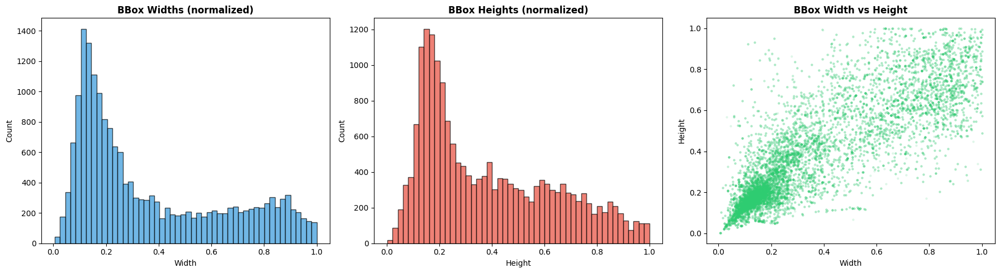


📏 BBox Statistics:
  Avg width:  0.3651
  Avg height: 0.3826
  Min width:  0.0050 | Max width:  1.0000
  Min height: 0.0010 | Max height: 1.0000


In [ ]:
# Analisis ukuran bounding box
bbox_widths = []
bbox_heights = []
bbox_classes = []

for label_file in train_labels:
    with open(label_file, 'r') as f:
        for line in f.readlines():
            parts = line.strip().split()
            if len(parts) >= 5:
                class_id = int(parts[0])
                w, h = float(parts[3]), float(parts[4])
                if class_id < len(class_names):
                    bbox_widths.append(w)
                    bbox_heights.append(h)
                    bbox_classes.append(class_names[class_id])

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Width distribution
axes[0].hist(bbox_widths, bins=50, color='#3498db', alpha=0.7, edgecolor='black')
axes[0].set_title('BBox Widths (normalized)', fontweight='bold')
axes[0].set_xlabel('Width')
axes[0].set_ylabel('Count')

# Height distribution
axes[1].hist(bbox_heights, bins=50, color='#e74c3c', alpha=0.7, edgecolor='black')
axes[1].set_title('BBox Heights (normalized)', fontweight='bold')
axes[1].set_xlabel('Height')
axes[1].set_ylabel('Count')

# Scatter plot width vs height
axes[2].scatter(bbox_widths, bbox_heights, alpha=0.1, s=5, c='#2ecc71')
axes[2].set_title('BBox Width vs Height', fontweight='bold')
axes[2].set_xlabel('Width')
axes[2].set_ylabel('Height')

plt.tight_layout()
plt.show()

print(f"\n📏 BBox Statistics:")
print(f"  Avg width:  {np.mean(bbox_widths):.4f}")
print(f"  Avg height: {np.mean(bbox_heights):.4f}")
print(f"  Min width:  {np.min(bbox_widths):.4f} | Max width:  {np.max(bbox_widths):.4f}")
print(f"  Min height: {np.min(bbox_heights):.4f} | Max height: {np.max(bbox_heights):.4f}")

### Visualisasi Sample Images dengan Bounding Box

In [ ]:
import supervision as sv
import cv2
import random

# Load dataset pakai supervision
ds_train = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset_location}/train/images",
    annotations_directory_path=f"{dataset_location}/train/labels",
    data_yaml_path=f"{dataset_location}/data.yaml"
)

print(f"✅ Training dataset loaded: {len(ds_train)} images")
print(f"📋 Classes: {ds_train.classes}")

✅ Training dataset loaded: 9215 images
📋 Classes: ['bus', 'car', 'van']


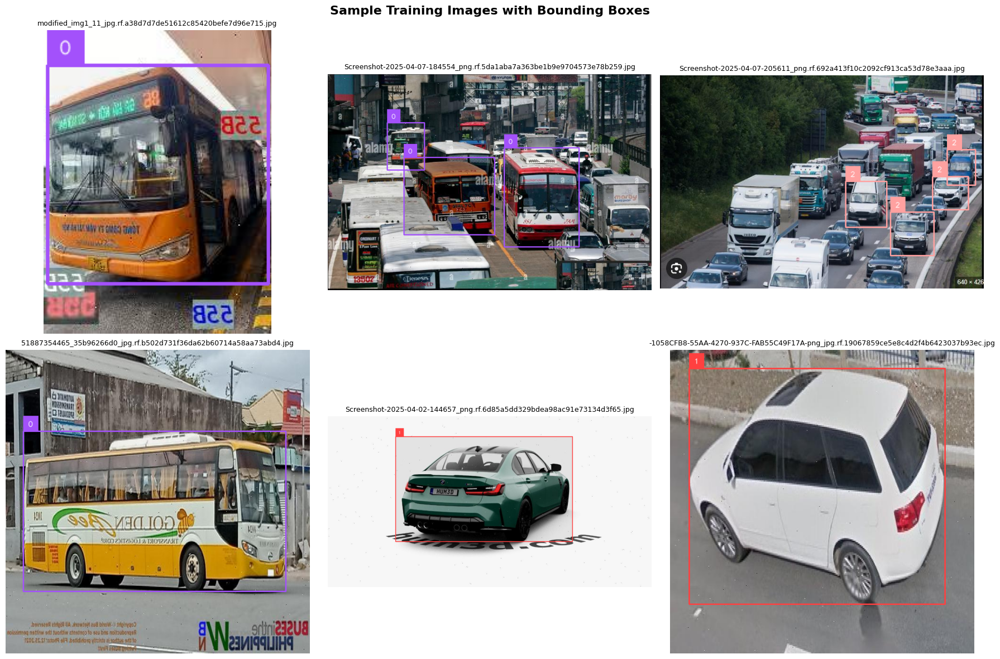

In [ ]:
# Visualisasi 6 sample images dengan bounding box
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
indices = random.sample(range(len(ds_train)), min(6, len(ds_train)))

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

for idx, ax in zip(indices, axes.flatten()):
    image_path, image, annotations = ds_train[idx]
    annotated = image.copy()
    annotated = box_annotator.annotate(scene=annotated, detections=annotations)
    annotated = label_annotator.annotate(scene=annotated, detections=annotations)

    # Handle both BGR and RGB
    if len(annotated.shape) == 3 and annotated.shape[2] == 3:
        annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
    else:
        annotated_rgb = annotated

    ax.imshow(annotated_rgb)
    ax.set_title(os.path.basename(image_path), fontsize=9)
    ax.axis('off')

plt.suptitle('Sample Training Images with Bounding Boxes', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

---
## 🧹 STEP 7: Data Preprocessing & Validation
---

Sebelum training, kita validasi dulu data-nya:
- Cek apakah ada file gambar yang corrupt
- Cek apakah ada label yang formatnya salah

In [ ]:
from PIL import Image

# Validasi images — cek file corrupt
print("🔍 Validating image files...")
corrupt_files = []
total_checked = 0

for split in ['train', 'valid', 'test']:
    img_dir = f"{dataset_location}/{split}/images"
    if not os.path.exists(img_dir):
        continue
    for img_file in glob.glob(f"{img_dir}/*"):
        total_checked += 1
        try:
            img = Image.open(img_file)
            img.verify()
        except Exception as e:
            corrupt_files.append(img_file)
            print(f"  ❌ Corrupt: {img_file}")

if not corrupt_files:
    print(f"✅ Semua {total_checked} image files valid!")
else:
    print(f"\n⚠️ Found {len(corrupt_files)} corrupt files dari {total_checked} total")

🔍 Validating image files...
✅ Semua 9722 image files valid!


In [ ]:
# Validasi labels — cek format dan class ID
print("🔍 Validating label files...")
invalid_labels = []
total_labels = 0
num_classes = len(class_names)

for split in ['train', 'valid', 'test']:
    label_dir = f"{dataset_location}/{split}/labels"
    if not os.path.exists(label_dir):
        continue
    for label_file in glob.glob(f"{label_dir}/*.txt"):
        total_labels += 1
        with open(label_file, 'r') as f:
            for line_num, line in enumerate(f.readlines(), 1):
                parts = line.strip().split()
                if len(parts) == 0:
                    continue
                if len(parts) != 5:
                    invalid_labels.append((label_file, line_num, "wrong format"))
                    continue
                class_id = int(parts[0])
                if class_id < 0 or class_id >= num_classes:
                    invalid_labels.append((label_file, line_num, f"invalid class_id: {class_id}"))

if not invalid_labels:
    print(f"✅ Semua {total_labels} label files valid!")
else:
    print(f"⚠️ Found {len(invalid_labels)} invalid labels:")
    for f, ln, reason in invalid_labels[:10]:
        print(f"  {os.path.basename(f)} line {ln}: {reason}")

🔍 Validating label files...
⚠️ Found 114 invalid labels:
  bus-117-_jpg.rf.e7f0818aabfa7abdd25092be9a44bace.txt line 1: wrong format
  bus-121-_jpg.rf.67dbe1c012fa44f96950de9d1c8c76db.txt line 1: wrong format
  bus-121-_jpg.rf.67dbe1c012fa44f96950de9d1c8c76db.txt line 2: wrong format
  bus-139-_jpg.rf.3ab167e54979caa23a6023ba0130aa4f.txt line 1: wrong format
  bus-139-_jpg.rf.3ab167e54979caa23a6023ba0130aa4f.txt line 2: wrong format
  bus-175-_jpg.rf.d40ae0a88e45187ab1922c02234738ff.txt line 1: wrong format
  bus-119-_jpg.rf.778ea0643afe464c651f6162e72007db.txt line 1: wrong format
  bus-119-_jpg.rf.778ea0643afe464c651f6162e72007db.txt line 2: wrong format
  bus-114-_jpg.rf.ea2e7d73fc4cd4c0b477ed94236eb587.txt line 1: wrong format
  bus-175-_jpg.rf.47b539f414fb1b4009b7111252ffa430.txt line 1: wrong format


---
## 🎨 STEP 8: Augmentation Strategy
---

### Instructions:
- ✅ **BOLEH (Non-Geometric):** Noise, brightness, contrast, color jitter, mosaic, mixup
- ❌ **TIDAK BOLEH (Geometric):** Flip, rotate, translate, scale, shear, perspective

**Alasan:** Transformasi geometris bisa mengubah orientasi kendaraan yang tidak realistis. Di dunia nyata, mobil tidak terbalik atau miring 90 derajat.

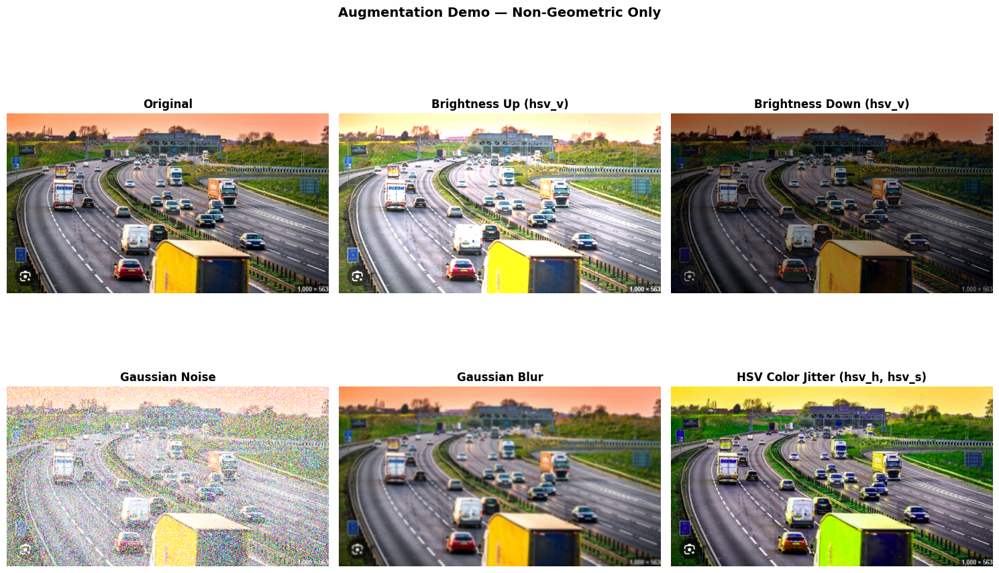


✅ Augmentasi yang dipakai saat training:
  • hsv_h=0.015   → Hue shift
  • hsv_s=0.7     → Saturation shift
  • hsv_v=0.4     → Brightness/Value shift
  • mosaic=1.0    → Mosaic (gabung 4 gambar jadi 1)
  • mixup=0.1     → Mixup (blend 2 gambar)

❌ Augmentasi yang DIMATIKAN (geometric):
  • fliplr=0.0    → Horizontal flip OFF
  • flipud=0.0    → Vertical flip OFF
  • degrees=0.0   → Rotation OFF
  • translate=0.0 → Translation OFF
  • scale=0.0     → Scaling OFF
  • shear=0.0     → Shear OFF


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Ambil 1 sample image untuk demo augmentasi
sample_images = glob.glob(f"{dataset_location}/train/images/*")
sample_img = cv2.imread(sample_images[0])
sample_img_rgb = cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)

# Demo berbagai augmentasi NON-GEOMETRIC
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# 1. Original
axes[0, 0].imshow(sample_img_rgb)
axes[0, 0].set_title('Original', fontweight='bold')

# 2. Brightness Up (HSV Value +)
bright = cv2.convertScaleAbs(sample_img_rgb, alpha=1.3, beta=30)
axes[0, 1].imshow(bright)
axes[0, 1].set_title('Brightness Up (hsv_v)', fontweight='bold')

# 3. Brightness Down (HSV Value -)
dark = cv2.convertScaleAbs(sample_img_rgb, alpha=0.7, beta=-30)
axes[0, 2].imshow(dark)
axes[0, 2].set_title('Brightness Down (hsv_v)', fontweight='bold')

# 4. Gaussian Noise
noise = np.random.normal(0, 25, sample_img_rgb.shape).astype(np.uint8)
noisy = cv2.add(sample_img_rgb, noise)
axes[1, 0].imshow(noisy)
axes[1, 0].set_title('Gaussian Noise', fontweight='bold')

# 5. Gaussian Blur
blurred = cv2.GaussianBlur(sample_img_rgb, (7, 7), 0)
axes[1, 1].imshow(blurred)
axes[1, 1].set_title('Gaussian Blur', fontweight='bold')

# 6. HSV Color Jitter (Hue + Saturation shift)
hsv = cv2.cvtColor(sample_img, cv2.COLOR_BGR2HSV).astype(np.float32)
hsv[:,:,0] = (hsv[:,:,0] + 15) % 180
hsv[:,:,1] = np.clip(hsv[:,:,1] * 1.3, 0, 255)
color_jitter = cv2.cvtColor(hsv.astype(np.uint8), cv2.COLOR_HSV2RGB)
axes[1, 2].imshow(color_jitter)
axes[1, 2].set_title('HSV Color Jitter (hsv_h, hsv_s)', fontweight='bold')

for ax in axes.flatten():
    ax.axis('off')

plt.suptitle('Augmentation Demo — Non-Geometric Only',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("\n✅ Augmentasi yang dipakai saat training:")
print("  • hsv_h=0.015   → Hue shift")
print("  • hsv_s=0.7     → Saturation shift")
print("  • hsv_v=0.4     → Brightness/Value shift")
print("  • mosaic=1.0    → Mosaic (gabung 4 gambar jadi 1)")
print("  • mixup=0.1     → Mixup (blend 2 gambar)")
print("\n❌ Augmentasi yang DIMATIKAN (geometric):")
print("  • fliplr=0.0    → Horizontal flip OFF")
print("  • flipud=0.0    → Vertical flip OFF")
print("  • degrees=0.0   → Rotation OFF")
print("  • translate=0.0 → Translation OFF")
print("  • scale=0.0     → Scaling OFF")
print("  • shear=0.0     → Shear OFF")

---
## 🚀 STEP 9: Update data.yaml Paths
---

Pastikan path di `data.yaml` mengarah ke lokasi yang benar di Colab.

In [ ]:
# Update data.yaml paths
with open(f"{dataset_location}/data.yaml", 'r') as f:
    data_yaml = yaml.safe_load(f)

data_yaml['train'] = f"{dataset_location}/train/images"
data_yaml['val'] = f"{dataset_location}/valid/images"
data_yaml['test'] = f"{dataset_location}/test/images"

with open(f"{dataset_location}/data.yaml", 'w') as f:
    yaml.dump(data_yaml, f, default_flow_style=False)

print("✅ data.yaml updated!")
print("\nContents:")
!cat {dataset_location}/data.yaml

✅ data.yaml updated!

Contents:
names:
- bus
- car
- van
nc: 3
roboflow:
  license: CC BY 4.0
  project: vehicle-detection-vznzd-dkl8g
  url: https://universe.roboflow.com/personal-project-kej16/vehicle-detection-vznzd-dkl8g/dataset/1
  version: 1
  workspace: personal-project-kej16
test: /content/vehicle-detection.v1i.yolov12/test/images
train: /content/vehicle-detection.v1i.yolov12/train/images
val: /content/vehicle-detection.v1i.yolov12/valid/images


---
## 🚀 STEP 10: Download Pretrained YOLOv12 Weights
---

In [ ]:
!wget -q https://github.com/sunsmarterjie/yolov12/releases/download/v1.0/yolov12n.pt
print("✅ YOLOv12n weights downloaded!")

✅ YOLOv12n weights downloaded!


---
## 🚀 STEP 11: Training Model (FIRST RUN)
---

### Training Configuration:
| Parameter | Value | Alasan |
|-----------|-------|--------|
| batch | 8 | Ringan untuk Colab free tier |
| imgsz | 480 | Lebih hemat memory, cukup untuk detect kendaraan |
| epochs | 50 | Target iterasi (bisa resume kalau disconnect) |
| patience | 10 | Early stopping kalau gak ada improvement |
| save_period | 5 | Save checkpoint tiap 5 epoch |

### ⚠️ PENTING:
- **Jalankan cell ini untuk TRAINING PERTAMA KALI**
- Kalau Colab disconnect di tengah training, **SKIP cell ini** dan langsung ke **STEP 12 (Resume)**

In [ ]:
from ultralytics import YOLO

# Load pretrained model
model = YOLO('yolov12n.pt')

# 🚀 TRAINING — FIRST RUN
results = model.train(
    data=f'{dataset_location}/data.yaml',
    epochs=50,
    batch=4,                  # ⬇️ Reduced dari 16 → 8 (hemat GPU memory)
    imgsz=640,                # ⬇️ Reduced dari 640 → 480 (hemat GPU memory)
    exist_ok=True,
    patience=10,              # Early stopping
    save_period=5,            # 💾 Save checkpoint tiap 5 epoch
    val=True,
    verbose=True,

    # ✅ Augmentasi NON-GEOMETRIC (BOLEH)
    hsv_h=0.015,              # Hue augmentation
    hsv_s=0.7,                # Saturation augmentation
    hsv_v=0.4,                # Brightness augmentation
    mosaic=1.0,               # Mosaic augmentation
    mixup=0.1,                # Mixup augmentation

    # ❌ Augmentasi GEOMETRIC (DIMATIKAN)
    fliplr=0.0,               # Horizontal flip OFF
    flipud=0.0,               # Vertical flip OFF
    degrees=0.0,              # Rotation OFF
    translate=0.0,            # Translation OFF
    scale=0.0,                # Scaling OFF
    shear=0.0,                # Shear OFF
    perspective=0.0,          # Perspective OFF
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.14 🚀 Python-3.12.12 torch-2.9.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/vehicle-detection.v1i.yolov12/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.0, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.

In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

# Lists training artifacts such as weights, result plots, and confusion matrix.
!ls {HOME}/runs/detect/train/

ls: cannot access '{HOME}/runs/detect/train/': No such file or directory


# 🚀 STEP 11.1: Visualize Training Results

Display the confusion matrix and training result curvers from the YOLO training run. The confusion matrix: how well the model distinguishes between classes.

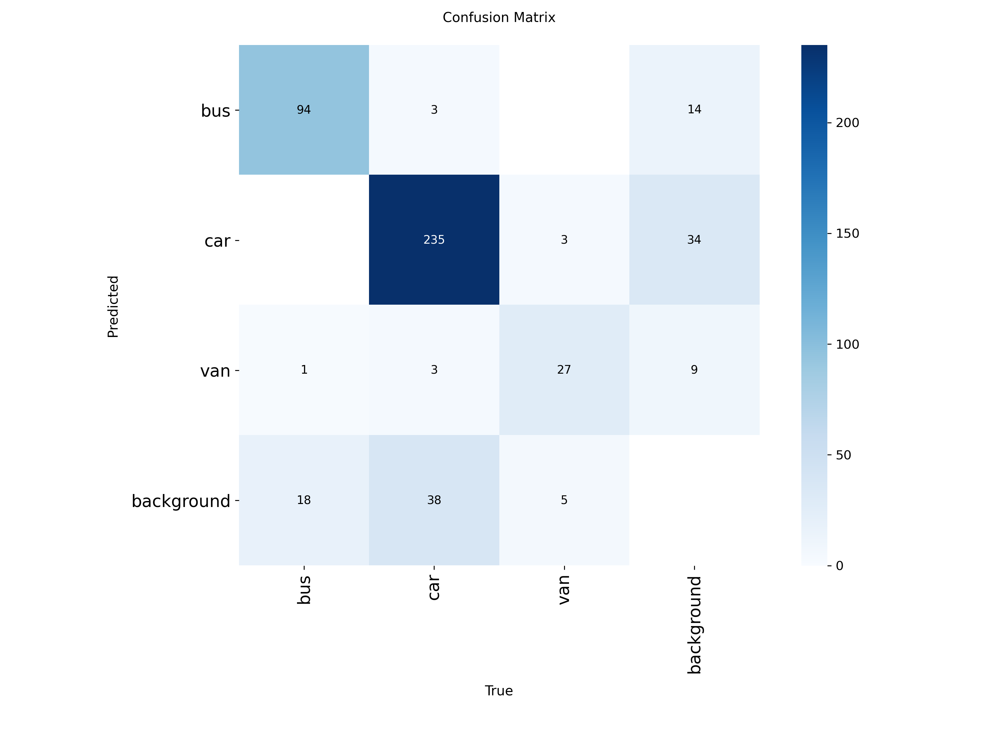

In [ ]:
from IPython.display import Image

Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=1000)

#### The training graph: loss, mAP, precision/recall over time.

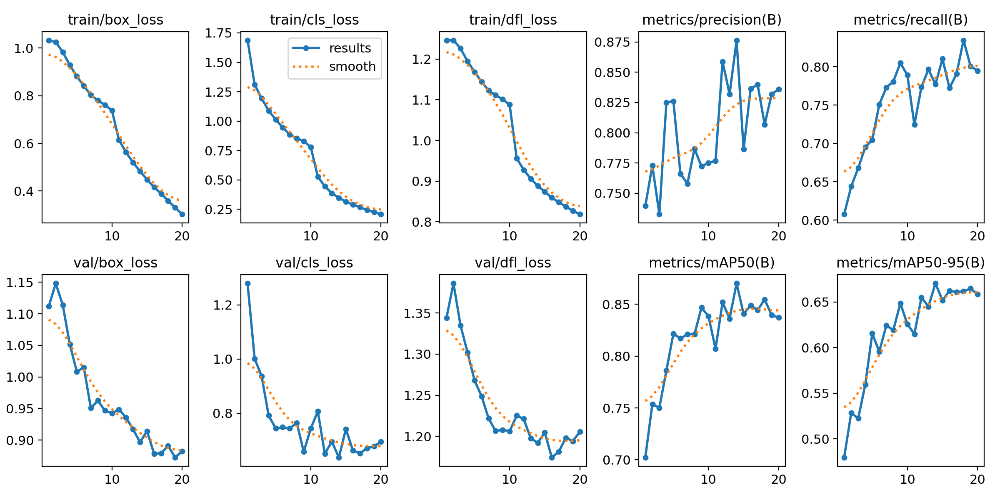

In [ ]:
from IPython.display import Image

Image(filename=f'{HOME}/runs/detect/train/results.png', width=1000)

# 🚀 STEP 11.2: Load Test Dataset for Evaluation

Prepare test data using Supervision's dataset loader to evaluate model performance.

In [ ]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset_location}/test/images",
    annotations_directory_path=f"{dataset_location}/test/labels",
    data_yaml_path=f"{dataset_location}/data.yaml"
)

ds.classes

['bus', 'car', 'van']

# 🚀 STEP 11.3: Compute Mean Average Precision

Evaluate the trained model using mAP metrics (50, 75 and 50:95)

In [ ]:
from supervision.metrics import MeanAveragePrecision

model = YOLO(f'/{HOME}/runs/detect/train/weights/best.pt')

predictions = []
targets = []

for _, image, target in ds:
    results = model(image, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(results)

    predictions.append(detections)
    targets.append(target)

map = MeanAveragePrecision().update(predictions, targets).compute()

The mAP metrics are printed and the results are plotted.

In [ ]:
print("mAP 50:95", map.map50_95)
print("mAP 50", map.map50)
print("mAP 75", map.map75)

mAP 50:95 0.6023334286516709
mAP 50 0.761698255993883
mAP 75 0.6978930740345756


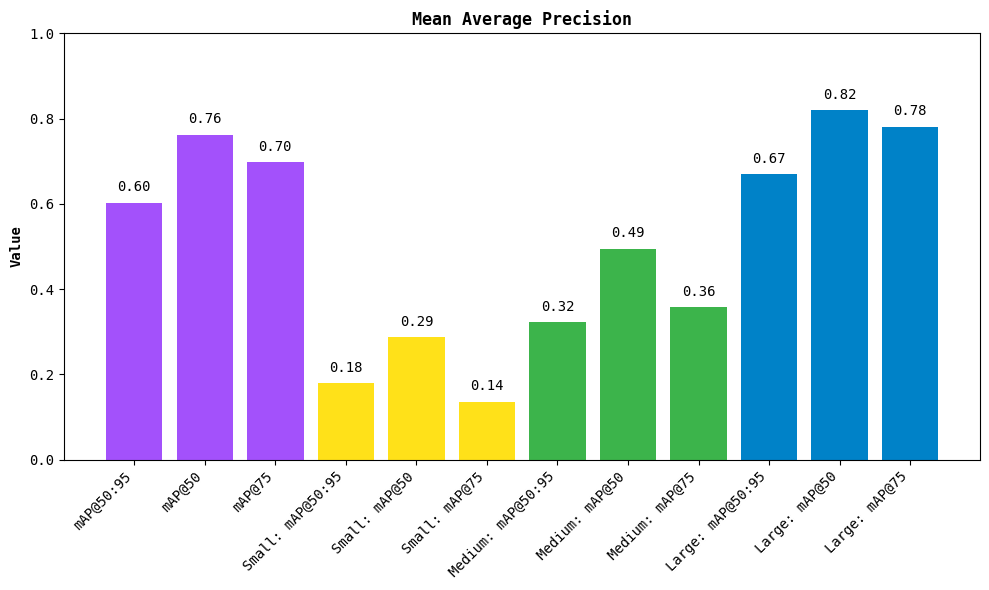

In [ ]:
map.plot()

# 🚀 STEP 11.4: Inference on Random Test Image

Run the trained model on a random test image and visualize detections.

In [ ]:
model = YOLO(f'/{HOME}/runs/detect/train/weights/best.pt')

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset_location}/test/images",
    annotations_directory_path=f"{dataset_location}/test/labels",
    data_yaml_path=f"{dataset_location}/data.yaml"
)

- Picks a random image.
- Runs the trained YOLOv12 model.
- Applies NMS (Non-Max Suppression) to clean overlapping boxes.

In [ ]:
import random

i = random.randint(0, len(ds))

image_path, image, target = ds[i]

results = model(image, verbose=False)[0]
detections = sv.Detections.from_ultralytics(results).with_nms()

box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

annotated_image = image.copy()
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

`plot_image` displays the final annotated image with predicted bounding boxes and labels.

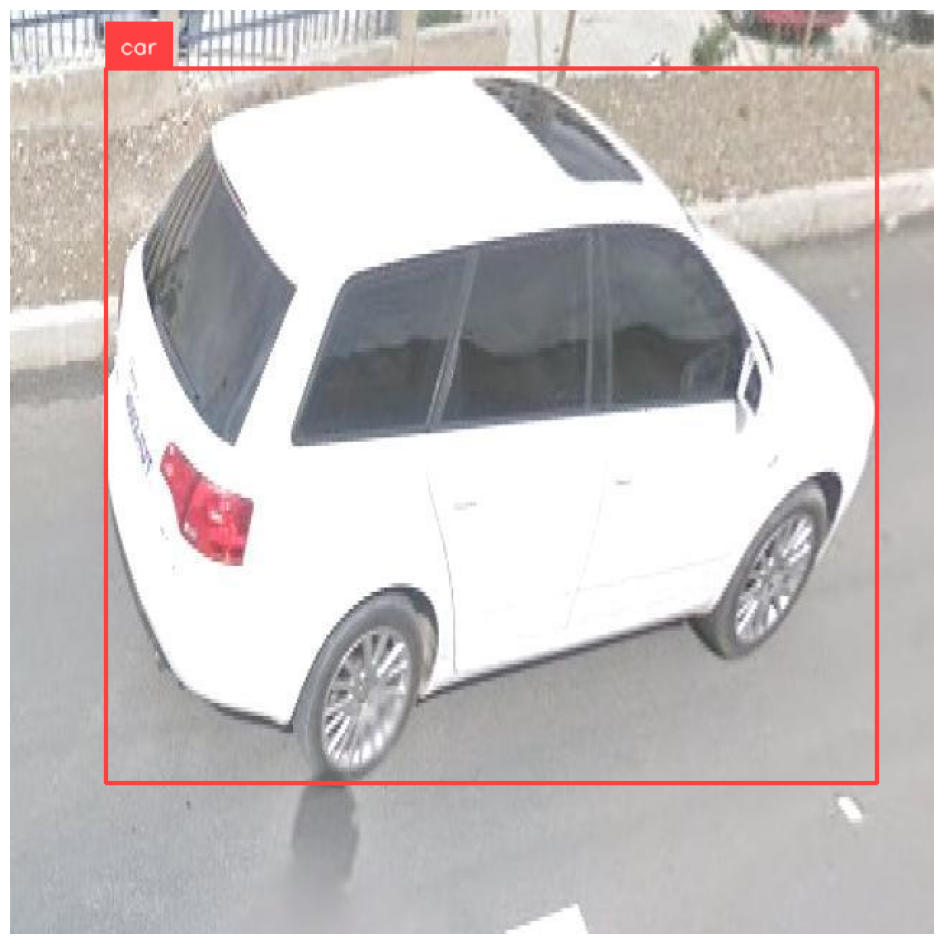

In [ ]:
sv.plot_image(annotated_image)

In [ ]:
# 💾 Backup training results ke Google Drive (jalankan setelah training selesai)
import shutil

drive_backup = "/content/drive/MyDrive/capstone4_vehicle_detection"
os.makedirs(drive_backup, exist_ok=True)

# Backup seluruh folder training
train_dir = f"{HOME}/runs/detect/train"
if os.path.exists(train_dir):
    backup_dir = f"{drive_backup}/train_backup"
    if os.path.exists(backup_dir):
        shutil.rmtree(backup_dir)
    shutil.copytree(train_dir, backup_dir)
    print(f"✅ Training results backed up to: {backup_dir}")
else:
    print("❌ Training directory not found")

✅ Training results backed up to: /content/drive/MyDrive/capstone4_vehicle_detection/train_backup


---
## 🔄 STEP 12: Resume Training (KALAU COLAB DISCONNECT)
---

### ⚠️ GUNAKAN CELL INI HANYA KALAU:
- Colab disconnect di tengah training
- Kamu mau lanjutin training dari checkpoint terakhir

### Cara pakai:
1. Reconnect ke Colab
2. Run ulang **STEP 1-4** (install, GPU, working dir, mount drive)
3. **SKIP STEP 11** (jangan run first training lagi!)
4. Jalankan cell di bawah ini

In [ ]:
# =============================================
# 🔄 RESUME TRAINING — dari Google Drive backup
# =============================================

from ultralytics import YOLO
import shutil

drive_backup = "/content/drive/MyDrive/capstone4_vehicle_detection/train_backup"

# Cek apakah ada backup di Google Drive
last_model = f"{drive_backup}/weights/last.pt"

if os.path.exists(last_model):
    print(f"✅ Found checkpoint: {last_model}")

    # Restore training directory dari backup
    local_train_dir = f"{HOME}/runs/detect/train"
    if not os.path.exists(local_train_dir):
        shutil.copytree(drive_backup, local_train_dir)
        print(f"✅ Training directory restored from backup")

    # Resume training!
    model = YOLO(f"{local_train_dir}/weights/last.pt")
    results = model.train(
        resume=True  # Lanjutkan dari epoch terakhir
    )
    print("\n✅ Resume training completed!")
else:
    print("❌ Tidak ada checkpoint yang ditemukan di Google Drive.")
    print("   Jalankan STEP 11 (First Run) terlebih dahulu.")

In [ ]:
# 💾 Backup lagi setelah resume (JALANKAN SETELAH RESUME SELESAI)
drive_backup_dir = "/content/drive/MyDrive/capstone4_vehicle_detection"
train_dir = f"{HOME}/runs/detect/train"

if os.path.exists(train_dir):
    backup_dir = f"{drive_backup_dir}/train_backup"
    if os.path.exists(backup_dir):
        shutil.rmtree(backup_dir)
    shutil.copytree(train_dir, backup_dir)
    print(f"✅ Updated backup saved to: {backup_dir}")

---
## 📈 STEP 13: Model Evaluation
---

### Compute mAP Metrics on Test Set

Evaluasi model menggunakan Mean Average Precision (mAP):
- **mAP@50**: IoU threshold = 0.50
- **mAP@75**: IoU threshold = 0.75 (lebih strict)
- **mAP@50:95**: Average across IoU 0.50-0.95 (paling comprehensive)

In [ ]:
from supervision.metrics import MeanAveragePrecision

# Load best model
best_model = YOLO(f'{HOME}/runs/detect/train/weights/best.pt')

# Load test dataset
ds_test = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset_location}/test/images",
    annotations_directory_path=f"{dataset_location}/test/labels",
    data_yaml_path=f"{dataset_location}/data.yaml"
)

print(f"✅ Test dataset: {len(ds_test)} images")
print(f"📋 Classes: {ds_test.classes}")

✅ Test dataset: 220 images
📋 Classes: ['bus', 'car', 'van']


In [ ]:
# Run predictions on test set
predictions = []
targets = []

print("🔍 Running inference on test set...")
for i, (_, image, target) in enumerate(ds_test):
    results = best_model(image, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(results)
    predictions.append(detections)
    targets.append(target)
    if (i + 1) % 50 == 0:
        print(f"  Processed {i+1}/{len(ds_test)} images...")

# Compute mAP
map_metric = MeanAveragePrecision().update(predictions, targets).compute()

print("\n" + "=" * 50)
print("📊 MODEL EVALUATION RESULTS (Test Set)")
print("=" * 50)
print(f"  mAP@50     : {map_metric.map50:.4f}")
print(f"  mAP@75     : {map_metric.map75:.4f}")
print(f"  mAP@50:95  : {map_metric.map50_95:.4f}")
print("=" * 50)

🔍 Running inference on test set...
  Processed 50/220 images...
  Processed 100/220 images...
  Processed 150/220 images...
  Processed 200/220 images...

📊 MODEL EVALUATION RESULTS (Test Set)
  mAP@50     : 0.7617
  mAP@75     : 0.6979
  mAP@50:95  : 0.6023


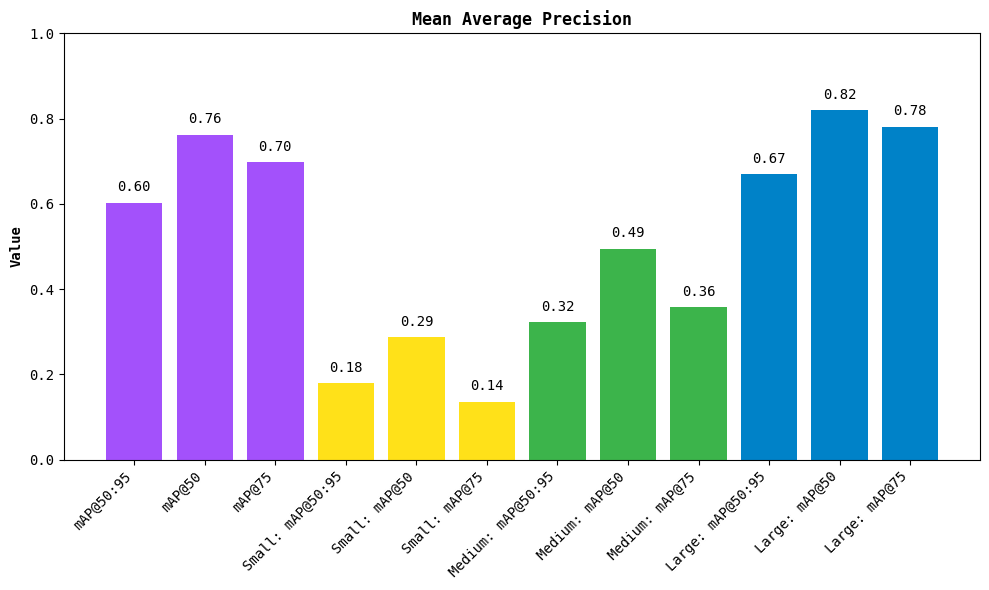

In [ ]:
# Plot mAP detail per class
map_metric.plot()

---
## 🔍 STEP 14: Inference & Vehicle Counting
---

### 14.1: Vehicle Detection & Counting Function

In [ ]:
def detect_and_count_vehicles(image_input, model, confidence_threshold=0.25):
    """
    Detect and count vehicles in an image.

    Args:
        image_input: Path to image (str) or numpy array
        model: YOLO model
        confidence_threshold: Minimum confidence for detection

    Returns:
        annotated_image: Image with bounding boxes
        vehicle_counts: Dictionary with vehicle counts per class
        total_vehicles: Total number of vehicles detected
        detections: Raw detection object
    """
    # Load image
    if isinstance(image_input, str):
        image = cv2.imread(image_input)
    else:
        image = image_input

    # Run inference
    results = model(image, conf=confidence_threshold, verbose=False)[0]
    detections = sv.Detections.from_ultralytics(results).with_nms()

    # Annotate
    box_annotator = sv.BoxAnnotator()
    label_annotator = sv.LabelAnnotator()
    annotated = image.copy()
    annotated = box_annotator.annotate(scene=annotated, detections=detections)
    annotated = label_annotator.annotate(scene=annotated, detections=detections)

    # Count per class
    vehicle_counts = {}
    for class_name in detections.data.get('class_name', []):
        vehicle_counts[class_name] = vehicle_counts.get(class_name, 0) + 1

    total_vehicles = sum(vehicle_counts.values())

    return annotated, vehicle_counts, total_vehicles, detections

print("✅ Function detect_and_count_vehicles() ready!")

✅ Function detect_and_count_vehicles() ready!


### 14.2: Test on Random Images

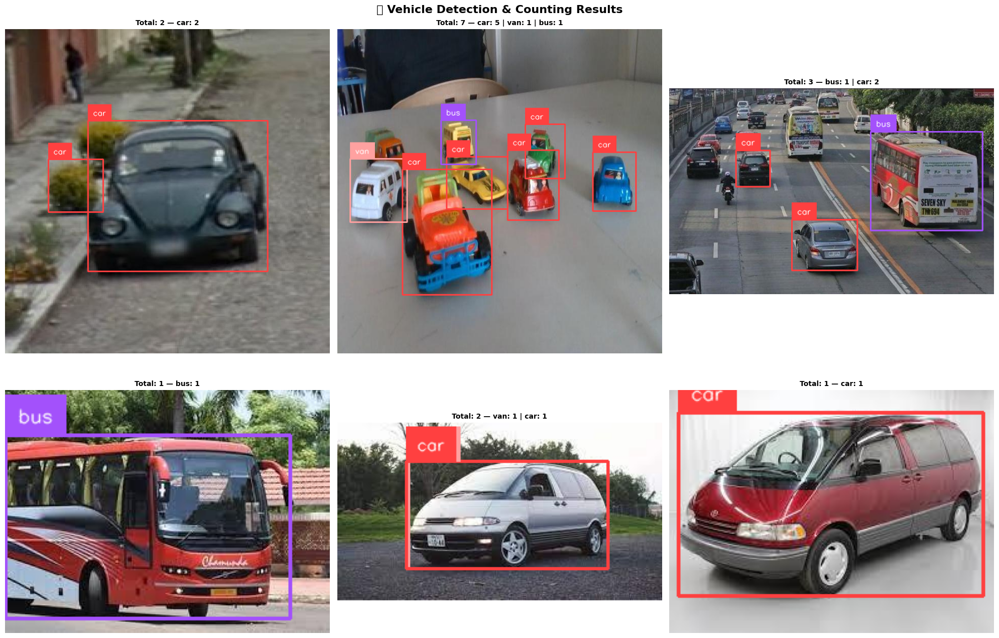

In [ ]:
# Load best model
best_model = YOLO(f'{HOME}/runs/detect/train/weights/best.pt')

# Inference pada 6 random test images
fig, axes = plt.subplots(2, 3, figsize=(20, 14))
test_images = glob.glob(f"{dataset_location}/test/images/*")
sample_indices = random.sample(range(len(test_images)), min(6, len(test_images)))

for i, ax in enumerate(axes.flatten()):
    if i >= len(sample_indices):
        ax.axis('off')
        continue

    img_path = test_images[sample_indices[i]]
    annotated, counts, total, _ = detect_and_count_vehicles(img_path, best_model)

    # Format count string
    count_str = ' | '.join([f"{cls}: {cnt}" for cls, cnt in counts.items()])
    if not count_str:
        count_str = "No vehicles detected"

    ax.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
    ax.set_title(f"Total: {total} — {count_str}", fontsize=10, fontweight='bold')
    ax.axis('off')

plt.suptitle('🚗 Vehicle Detection & Counting Results', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

### 14.3: Detailed Single Image Analysis

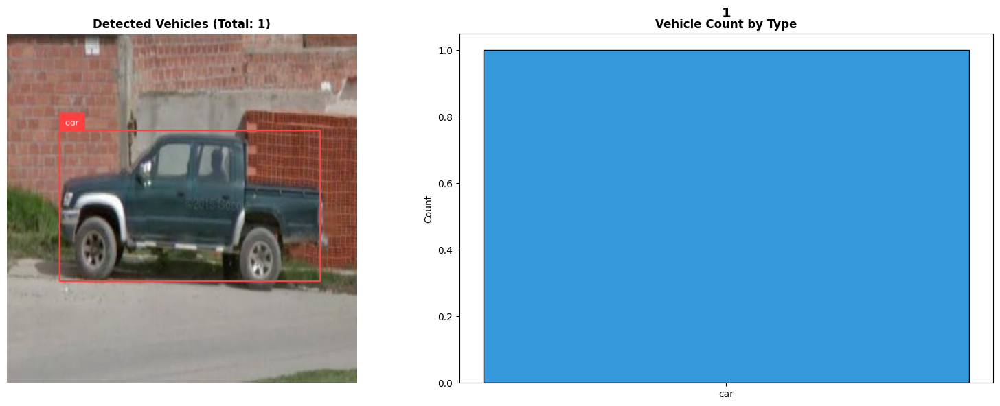


🚗 VEHICLE DETECTION REPORT
  Image: -BABD5091-6597-40E1-82D1-29A0F4DCD9E0-png_jpg.rf.430d918599479bb645c8e3fb8920296b.jpg
  ─────────────────────
  car       : 1
  ─────────────────────
  TOTAL     : 1


In [ ]:
# Analisis detail pada 1 gambar
sample_path = test_images[random.randint(0, len(test_images)-1)]
annotated, counts, total, detections = detect_and_count_vehicles(sample_path, best_model)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Detected image
axes[0].imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
axes[0].set_title(f'Detected Vehicles (Total: {total})', fontweight='bold')
axes[0].axis('off')

# Bar chart of counts
if counts:
    vehicle_types = list(counts.keys())
    vehicle_nums = list(counts.values())
    colors = ['#3498db', '#e74c3c', '#2ecc71']
    bars = axes[1].bar(vehicle_types, vehicle_nums, color=colors[:len(vehicle_types)], edgecolor='black')
    for bar, num in zip(bars, vehicle_nums):
        axes[1].text(bar.get_x() + bar.get_width()/2., bar.get_height() + 0.1,
                     str(num), ha='center', fontweight='bold', fontsize=14)
    axes[1].set_title('Vehicle Count by Type', fontweight='bold')
    axes[1].set_ylabel('Count')
else:
    axes[1].text(0.5, 0.5, 'No vehicles detected', ha='center', va='center', fontsize=14)

plt.tight_layout()
plt.show()

# Print detailed results
print("\n" + "=" * 40)
print("🚗 VEHICLE DETECTION REPORT")
print("=" * 40)
print(f"  Image: {os.path.basename(sample_path)}")
print(f"  ─────────────────────")
for vehicle_type, count in counts.items():
    print(f"  {vehicle_type:<10}: {count}")
print(f"  ─────────────────────")
print(f"  {'TOTAL':<10}: {total}")
print("=" * 40)

### 14.4: Batch Analysis — Aggregate Statistics

In [ ]:
from collections import Counter

# Analisis batch pada semua test images
all_counts = Counter()
per_image_totals = []

print("🔍 Running batch analysis on test set...")
for i, img_path in enumerate(test_images):
    _, counts, total, _ = detect_and_count_vehicles(img_path, best_model)
    all_counts.update(counts)
    per_image_totals.append(total)
    if (i + 1) % 50 == 0:
        print(f"  Processed {i+1}/{len(test_images)} images...")

print("\n" + "=" * 50)
print("📊 AGGREGATE RESULTS — All Test Images")
print("=" * 50)
for vehicle_type, count in all_counts.most_common():
    print(f"  {vehicle_type:<10}: {count} detected")
print(f"  ──────────────────────")
print(f"  {'TOTAL':<10}: {sum(all_counts.values())} vehicles")
print(f"  Images   : {len(test_images)}")
print(f"  Average  : {np.mean(per_image_totals):.1f} vehicles/image")
print(f"  Min      : {np.min(per_image_totals)} vehicles/image")
print(f"  Max      : {np.max(per_image_totals)} vehicles/image")
print("=" * 50)

🔍 Running batch analysis on test set...
  Processed 50/220 images...
  Processed 100/220 images...
  Processed 150/220 images...
  Processed 200/220 images...

📊 AGGREGATE RESULTS — All Test Images
  car       : 250 detected
  bus       : 102 detected
  van       : 64 detected
  ──────────────────────
  TOTAL     : 416 vehicles
  Images   : 220
  Average  : 1.9 vehicles/image
  Min      : 0 vehicles/image
  Max      : 8 vehicles/image


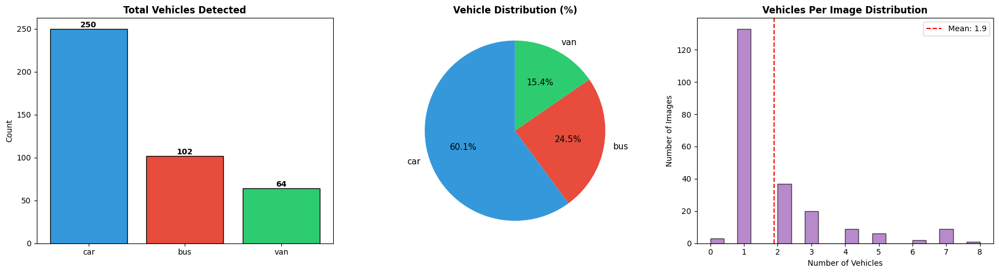

In [ ]:
# Visualisasi aggregate results
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

colors = ['#3498db', '#e74c3c', '#2ecc71']
vehicle_types = list(all_counts.keys())
vehicle_nums = list(all_counts.values())

# 1. Bar chart — total per class
bars = axes[0].bar(vehicle_types, vehicle_nums, color=colors[:len(vehicle_types)], edgecolor='black')
axes[0].set_title('Total Vehicles Detected', fontweight='bold')
axes[0].set_ylabel('Count')
for bar, num in zip(bars, vehicle_nums):
    axes[0].text(bar.get_x() + bar.get_width()/2., bar.get_height() + 2,
                 str(num), ha='center', fontweight='bold')

# 2. Pie chart — distribution
axes[1].pie(vehicle_nums, labels=vehicle_types, autopct='%1.1f%%',
            colors=colors[:len(vehicle_types)], startangle=90,
            textprops={'fontsize': 11})
axes[1].set_title('Vehicle Distribution (%)', fontweight='bold')

# 3. Histogram — vehicles per image
axes[2].hist(per_image_totals, bins=20, color='#9b59b6', alpha=0.7, edgecolor='black')
axes[2].set_title('Vehicles Per Image Distribution', fontweight='bold')
axes[2].set_xlabel('Number of Vehicles')
axes[2].set_ylabel('Number of Images')
axes[2].axvline(np.mean(per_image_totals), color='red', linestyle='--', label=f'Mean: {np.mean(per_image_totals):.1f}')
axes[2].legend()

plt.tight_layout()
plt.show()

---
## 💾 STEP 15: Save Final Model to Google Drive
---

Save model terbaik ke Google Drive untuk download dan dipakai di Streamlit app.

In [ ]:
import shutil

# Folder output di Google Drive
drive_output = "/content/drive/MyDrive/capstone4_vehicle_detection"
os.makedirs(drive_output, exist_ok=True)

# Copy best.pt
src_model = f"{HOME}/runs/detect/train/weights/best.pt"
dst_model = f"{drive_output}/best_vehicle.pt"
shutil.copy2(src_model, dst_model)
print(f"✅ Model saved: {dst_model}")

# Copy training artifacts untuk dokumentasi
artifacts = ['confusion_matrix.png', 'confusion_matrix_normalized.png',
             'results.png', 'results.csv']
for artifact in artifacts:
    src = f"{HOME}/runs/detect/train/{artifact}"
    if os.path.exists(src):
        shutil.copy2(src, f"{drive_output}/{artifact}")
        print(f"✅ {artifact} saved!")

print(f"\n📁 All files saved to: {drive_output}")
print(f"\n🎯 NEXT STEPS:")
print(f"  1. Download best_vehicle.pt dari Google Drive")
print(f"  2. Taruh di folder project VS Code kamu")
print(f"  3. Bikin Streamlit app (app.py)")
print(f"  4. Deploy ke Streamlit Community Cloud")

✅ Model saved: /content/drive/MyDrive/capstone4_vehicle_detection/best_vehicle.pt
✅ confusion_matrix.png saved!
✅ confusion_matrix_normalized.png saved!
✅ results.png saved!
✅ results.csv saved!

📁 All files saved to: /content/drive/MyDrive/capstone4_vehicle_detection

🎯 NEXT STEPS:
  1. Download best_vehicle.pt dari Google Drive
  2. Taruh di folder project VS Code kamu
  3. Bikin Streamlit app (app.py)
  4. Deploy ke Streamlit Community Cloud
